This notebook investigates different initiation strategies for the ScopeBO runs

In [1]:
import sys
import os
sys.path.append(os.path.abspath(os.path.join('..','..','..')))
from pathlib import Path
import pandas as pd
import ast
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from Code.benchmark import Benchmark
from matplotlib.lines import Line2D
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
import matplotlib.colors as mcolors
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
import colorsys

# Doyle colors
doyle_colors = ["#CE4C6F", "#1561C2", "#188F9D","#C4ADA2","#515798", "#CB7D85", "#A9A9A9"]
# extension of palette with lighter and darker versions
def adjust_lightness(color, factor=1.2):
    """
    Function to make colors lighter (factor > 1) or darker (factor < 1).
    """
    r, g, b = mcolors.to_rgb(color)
    h, l, s = colorsys.rgb_to_hls(r, g, b)
    l = max(0, min(1, l * factor))
    r, g, b = colorsys.hls_to_rgb(h, l, s)
    return mcolors.to_hex((r, g, b))

lighter = [adjust_lightness(c, 1.2) for c in doyle_colors]
darker  = [adjust_lightness(c, 0.7) for c in doyle_colors]
all_colors = doyle_colors + darker[::-1] + lighter[::-1] 

# Save the categorical colormap
cat_cmap = ListedColormap(all_colors, name="Doyle_cat")
plt.colormaps.register(cat_cmap)

# Define and save a continuous colormap
colors = [doyle_colors[1],"#FFFFFFD1",doyle_colors[0]]
cont_cmap = LinearSegmentedColormap.from_list("Doyle_cont", colors)
plt.colormaps.register(cont_cmap)

wdir = Path(".")

# General plt parameters
plt.rcParams.update({
    "axes.titlesize": 20,        # Subplot title
    "axes.labelsize": 16,        # X and Y labels
    "figure.titlesize": 24,      # Suptitle
    "xtick.labelsize": 14,       # X tick labels
    "ytick.labelsize": 14,       # Y tick labels
    "legend.fontsize": 14,       # Legend text
    "legend.title_fontsize": 14  # Legend titles
})

In [2]:
# define a running variable with the datasets
datasets = ["high","medium","low"]
# load the distribution metrics for the standardization
df_bounds = pd.read_csv("./../0_Data/Datasets/Datasets_Hyperpar_Opt/bounds.csv",index_col=0)
# define a function to extract the relevant means and stdev's in a format suitable for the Benchmark class
# define a function to extract the relevant bounds in a format suitable for the Benchmark class
def get_bounds(dset):
    bounds = {}
    # get the metrics for the rate objective
    bounds["rate"] = (df_bounds.loc["obj_max",dset],df_bounds.loc["obj_min",dset])
    # get the metrics for the vendi score
    bounds["vendi"] = (df_bounds.loc["vendi_max",dset],df_bounds.loc["vendi_min",dset])

    return bounds



Run scopes using different initiation methods with the optimized hyperparameters

In [3]:
# for dset in datasets:
#     for initiation in ["Random_initiation","CVT_sampling","LHS_sampling"]:
#         init_label = None
#         if initiation == "Random_initation":
#             init_label = "random"
#         else:
#             init_label = initiation.split("_")[0].lower()
#         Benchmark().collect_data(
#             filename_labelled = f"./../0_Data/Datasets/Datasets_Hyperpar_Opt/data-{dset}.csv", 
#             name_results = f"./Results_Data/{dset}_dataset/Scope_{initiation}",
#             objectives=['rate'],
#             budget=27,
#             batches=[3],
#             Vendi_pruning_fractions = [13],
#             seeds = 20,
#             acquisition_function_mode= "balanced",
#             pruning_metric = "vendi_batch",
#             init_sampling_method= init_label)

Visualize the standard deviation of the samples using random initiation

In [4]:
# Ensure the "medium" dataset exists in your dataset list
target_dataset = "medium"
initiation = "Random_initiation"

fig, axes = plt.subplots(1, 3, figsize=(20, 7),dpi=600)
fig.supxlabel("Scope size",fontsize=16)

# Loop through each type of result
for j, type_results in enumerate(["Scope", "Objective", "Vendi"]):
    dfs = {}
    dfs_std = {}

    dfs_progress = Benchmark().progress_plot(
        budget=27,
        type_results=type_results,
        name_results=f"Results_Data/{target_dataset}_dataset/Scope_{initiation}",
        bounds=get_bounds(target_dataset),
        show_plot=False,
        scope_method="prod"
    )
    dfs[initiation] = dfs_progress["means"]
    dfs_std[initiation] = dfs_progress["stdev"]

    means = pd.concat(dfs, axis=1)
    means.columns = [multiindex[0] for multiindex in means.columns]
    stds = pd.concat(dfs_std, axis=1)
    stds.columns = [multiindex[0] for multiindex in stds.columns]

    ax = axes[j]

    for i,col in enumerate(means.columns):
        x = means.index.values
        mean = means[col].values
        std = stds[col].values

        # Mask NaN values
        mask = ~np.isnan(mean) & ~np.isnan(std)
        x, mean, std = x[mask], mean[mask], std[mask]

        color = all_colors[1]
        ax.plot(x, mean, label=col, color=color)
        ax.fill_between(x, mean - std, mean + std, alpha=0.1, color=color)
        ax.plot(x, mean + std, linestyle="--", color=color, alpha=0.3)
        ax.plot(x, mean - std, linestyle="--", color=color, alpha=0.3)


    if type_results  == "Objective":
        ax.set_title("Average rate")
        ax.set_ylabel("Average rate")
    ax.set_ylabel(f"{type_results} score")
    ax.set_title(f"{type_results} score")

fig.suptitle(f"Standard deviation for different metrics  (Dataset: {target_dataset}; random initiation)", fontsize=24)
plt.tight_layout()
plt.show()


## Compare the different initiation methods

Visualization of the standard deviation across the seeds

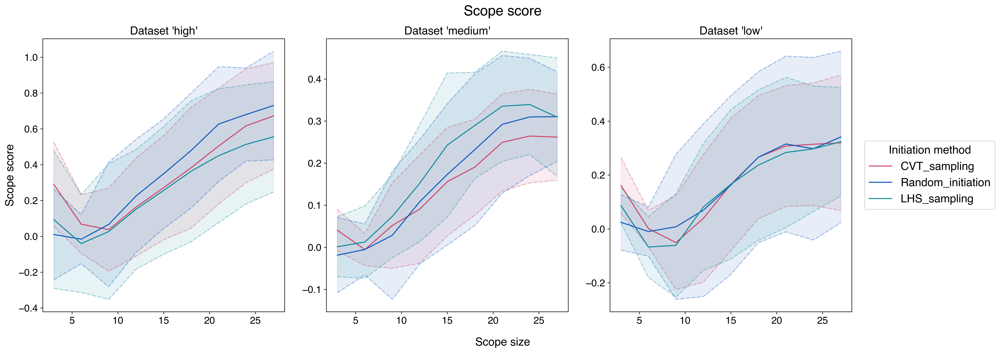

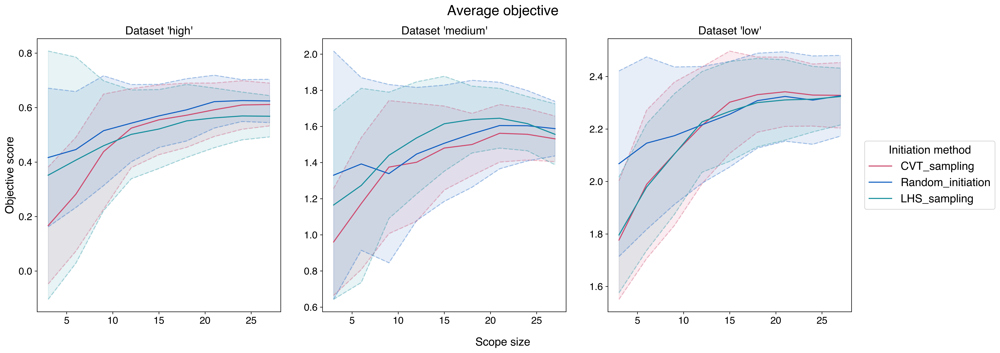

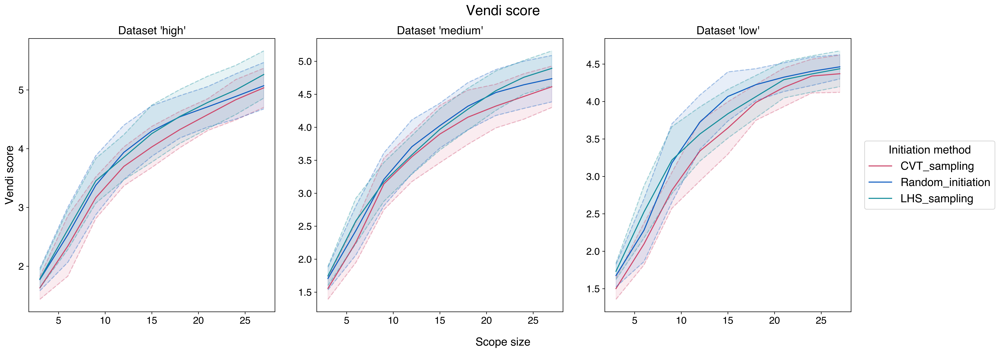

In [5]:
results = {}
stdevs  = {}
for type_results in ["Scope","Objective","Vendi"]:
    # Initialize the figure
    fig, axes = plt.subplots(1,4,figsize=(20,7), gridspec_kw={'width_ratios': [1, 1, 1, 0.3]},dpi=600)
    fig.supxlabel("Scope size",fontsize=16)
    if type_results == "Objective":
        fig.suptitle("Average objective", fontsize =20)
    else:
        fig.suptitle(f"{type_results} score", fontsize =20)
    for i,dset in enumerate(datasets):
        dfs = {}
        dfs_std = {}
        for initiation in ["CVT_sampling","Random_initiation","LHS_sampling"]:

            dfs_progress = Benchmark().progress_plot(budget=27, type_results= type_results,
                                        name_results=f"Results_Data/{dset}_dataset/Scope_{initiation}",
                                        bounds=get_bounds(dset),show_plot=False,scope_method="prod")
            dfs[initiation] = dfs_progress["means"]
            dfs_std[initiation] = dfs_progress["stdev"]

        means = pd.concat(dfs,axis=1)
        means.columns = [multiindex[0] for multiindex in means.columns]
        stds = pd.concat(dfs_std,axis=1)
        stds.columns = [multiindex[0] for multiindex in stds.columns]
        if type_results == "Scope":
            results[dset] = means
            stdevs[dset]  = stds
        for j,col in enumerate(means.columns):
            x    = means.index.values
            mean = means[col].values
            std  = stds[col].values

            # mask nan values that would hinder printing
            mask = ~np.isnan(mean) & ~np.isnan(std)
            x, mean, std = x[mask], mean[mask], std[mask]

            color = all_colors[j]
            axes[i].plot(x, mean, label=col, color=color)
            axes[i].fill_between(x, mean - std, mean + std, alpha=0.1, color=color)
            axes[i].plot(x, mean + std, linestyle="--", color=color, alpha=0.3)
            axes[i].plot(x, mean - std, linestyle="--", color=color, alpha=0.3)

        axes[0].set_ylabel(f"{type_results} score",fontsize=16)
        axes[i].set_title(f"Dataset '{dset}'",fontsize=16)
        if i == 0:
            handles_collected, labels_collected = axes[i].get_legend_handles_labels()
    axes[3].axis('off')
    axes[3].legend(handles=handles_collected, labels=labels_collected, title = "Initiation method",
                                                        fontsize=16, loc='center',title_fontsize=16)
    plt.tight_layout()
    plt.show()

In [6]:
final_scores = pd.DataFrame([results[dset].iloc[-1] for dset in datasets], index= [f"{dset} dataset" for dset in datasets],
                            columns=results[datasets[0]].columns)
print("Final scope scores:")
final_scores

Final scope scores:


,CVT_sampling,Random_initiation,LHS_sampling
high dataset,0.672215,0.730313,0.555518
medium dataset,0.261875,0.310601,0.309376
low dataset,0.319433,0.341009,0.323397


In [7]:
final_stdevs = pd.DataFrame([stdevs[dset].iloc[-1] for dset in datasets], index= [f"{dset} dataset" for dset in datasets],
                            columns=stdevs[datasets[0]].columns)
print("Standard deviations of final scope scores:")
final_stdevs

Standard deviations of final scope scores:


,CVT_sampling,Random_initiation,LHS_sampling
high dataset,0.297833,0.303591,0.308126
medium dataset,0.102413,0.106645,0.140876
low dataset,0.251162,0.318436,0.201315


Visualization of the min-max range across the seeds

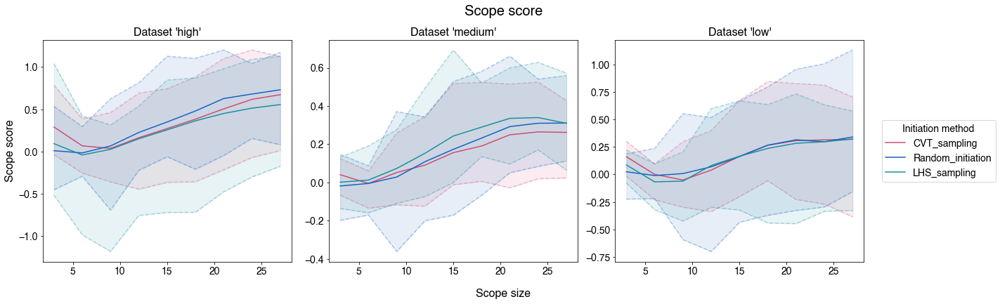

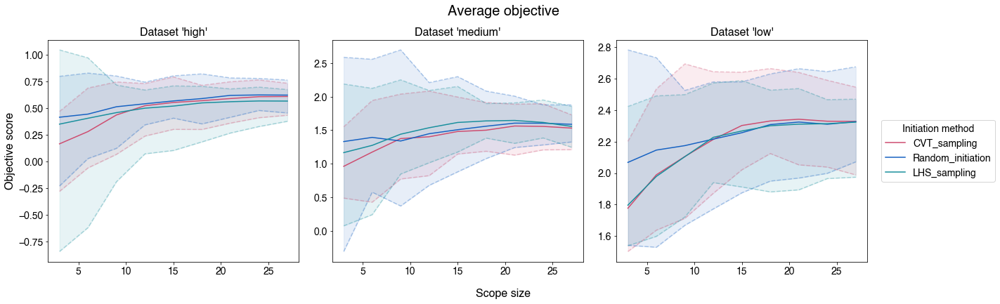

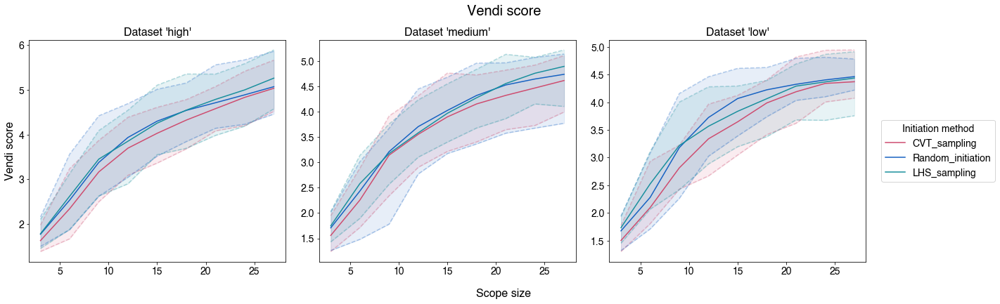

In [8]:
results = {}
max_values  = {}
min_values = {}
for type_results in ["Scope","Objective","Vendi"]:
    # Initialize the figure
    fig, axes = plt.subplots(1,4,figsize=(20,6), gridspec_kw={'width_ratios': [1, 1, 1, 0.3]})
    fig.supxlabel("Scope size",fontsize=16)
    if type_results == "Objective":
        fig.suptitle("Average objective", fontsize =20)
    else:
        fig.suptitle(f"{type_results} score", fontsize =20)
    for i,dset in enumerate(datasets):
        dfs = {}
        dfs_max = {}
        dfs_min = {}
        for initiation in ["CVT_sampling","Random_initiation","LHS_sampling"]:

                dfs_progress = Benchmark().progress_plot(budget=27, type_results= type_results,
                                        name_results=f"Results_Data/{dset}_dataset/Scope_{initiation}",
                                        bounds=get_bounds(dset),show_plot=False,scope_method="prod")
                dfs[initiation] = dfs_progress["means"]
                dfs_max[initiation] = dfs_progress["max"]
                dfs_min[initiation] = dfs_progress["min"]
                
        means = pd.concat(dfs,axis=1)
        means.columns = [multiindex[0] for multiindex in means.columns]
        maxvals = pd.concat(dfs_max,axis=1)
        maxvals.columns = [multiindex[0] for multiindex in maxvals.columns]
        minvals = pd.concat(dfs_min,axis=1)
        minvals.columns = [multiindex[0] for multiindex in minvals.columns]

        if type_results == "Scope":
            results[dset] = means
            max_values[dset]  = maxvals
            min_values[dset] = minvals
        for j,col in enumerate(means.columns):
            x    = means.index.values
            mean = means[col].values
            maxval  = maxvals[col].values
            minval = minvals[col].values

            # mask nan values that would hinder printing
            mask = ~np.isnan(mean) & ~np.isnan(maxval) & ~np.isnan(minval)
            x, mean, maxval, minval = x[mask], mean[mask], maxval[mask], minval[mask]

            color = all_colors[j]
            axes[i].plot(x, mean, label=col, color=color)
            axes[i].fill_between(x, minval, maxval, alpha=0.1, color=color)
            axes[i].plot(x, maxval, linestyle="--", color=color, alpha=0.3)
            axes[i].plot(x, minval, linestyle="--", color=color, alpha=0.3)
            axes[0].set_ylabel(f"{type_results} score",fontsize=16)
            axes[i].set_title(f"Dataset '{dset}'",fontsize=16)
            if i == 0:
                handles_collected, labels_collected = axes[i].get_legend_handles_labels()
        axes[3].axis('off')
        axes[3].legend(handles=handles_collected, labels=labels_collected, title = "Initiation method",
                                                            fontsize=14, loc='center')
    plt.tight_layout()
    plt.show()

In [9]:
final_minvals = pd.DataFrame([min_values[dset].iloc[-1] for dset in datasets], index=datasets,columns=stdevs[datasets[0]].columns)
print("Worst-case values of final scope scores:")
final_minvals

Worst-case values of final scope scores:


,CVT_sampling,Random_initiation,LHS_sampling
high,0.011153,0.081225,-0.173791
medium,0.023239,0.112441,0.064148
low,-0.385668,-0.155853,-0.327609


## Analysis of individual random seeds

To analyze which initiations lead to a high final scope score, the individual random seeds were analyzed.

In [10]:
initiation = "random_initiation"
dfs_raw_data = {}
for dset in datasets:
    # get the data for the inidividual seeds
    _, dfs_raw_data[dset] = Benchmark.get_metric_overview(bounds=get_bounds(dset),budget=27,type_results="scope", 
                                name_results=f"Results_Data/{dset}_dataset/Scope_{initiation}")
    # dfs_raw_data[dset] contains a dict for all batch-pruning combination with another dict as 
    # the value which contains the data for the random seeds
    # here, we only have one combination (b3_V13 --> optimized hyperparameters)
    # --> reassign dfs_raw_data[dset] for simplier handling
    dfs_raw_data[dset] = dfs_raw_data[dset]["b3_V13"]

In [11]:
# illustration of the structure of the dfs in dfs_raw_data[dset], the keys of dfs_raw_data are the seeds and the values the data
# in the dfs, the indices are the rounds of experiments
print("Example dataframe to visualize the structure:")
dfs_raw_data["high"][0]

Example dataframe to visualize the structure:


,vendi,rate,scope
0,1.781269,0.666406,-0.203055
1,3.141013,0.710341,0.295623
2,4.140029,0.684286,0.625352
3,4.366422,0.722513,0.813473
4,4.520022,0.805065,1.126095
5,4.464688,0.807127,1.102879
6,4.788200,0.785592,1.201793
7,4.783924,0.683734,0.853849
8,5.010956,0.703934,1.009985


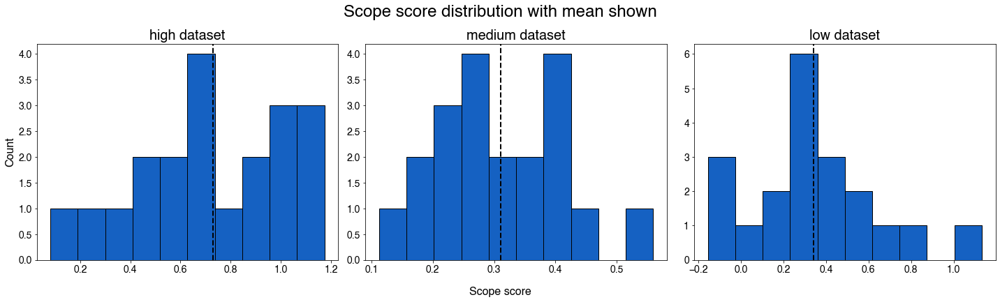

In [12]:
# get and plot the final scope scores for the inidividual seeds
nr_seeds = len(dfs_raw_data["high"])  # NOTE: same number of seeds for all datasets
score_dict = {}
mean_scores = {}
fig,axes = plt.subplots(1,3,figsize=(20,6))
fig.suptitle("Scope score distribution with mean shown")
fig.supxlabel("Scope score",fontsize=16)
for i,dset in enumerate(datasets):
    score_list = [dfs_raw_data[dset][i].loc[8,"scope"] for i in range(nr_seeds)]
    score_dict[dset] = score_list
    mean_score = np.mean(score_list)  # mean scope score
    mean_scores[dset] = mean_score
    axes[i].hist(score_list, color=all_colors[1], bins=10, edgecolor="k")
    mean_line = axes[i].axvline(x=mean_score, color='black', linestyle='--', linewidth=2)
    axes[i].set_title(f"{dset} dataset")
    axes[i].set_ylabel("")
axes[0].set_ylabel("Count")
plt.tight_layout()
plt.show()


In [13]:
# get lists for the metrics of the initial samples
initial_vendi = {}
initial_obj = {}
initial_scope_score = {}
sum_initial_samples = pd.DataFrame(np.nan,index=datasets,columns=["Mean initial Vendi score",
                                                                  "Mean initial Vendi score top5 scope scores",
                                                                  "Mean initial average rate",
                                                                  "Mean initial average rate top5 scope scores"])
for dset in datasets:
    initial_vendi[dset] = [dfs_raw_data[dset][i].loc[0,"vendi"] for i in range(nr_seeds)]
    initial_obj[dset] = [dfs_raw_data[dset][i].loc[0,"rate"] for i in range(nr_seeds)]
    initial_scope_score[dset] = [dfs_raw_data[dset][i].loc[0,"scope"] for i in range(nr_seeds)]
    sum_initial_samples.loc[dset,"Mean initial Vendi score"] = round(np.mean(initial_vendi[dset]),3)
    sum_initial_samples.loc[dset,"Mean initial average rate"] = round(np.mean(initial_obj[dset]),3)

    # get the seeds that give the top 5 highest scope scores
    indexed_scores = list(enumerate(score_dict[dset]))  # generate (index,score) tuples
    top_5 = sorted(indexed_scores, key=lambda x: x[1], reverse=True)[:5]  # sort by score
    best_seeds = [index for index, score in top_5]
    print(f"Top 5 seeds by final scope score ({dset} dataset):", best_seeds)

    # get the averages of the initial samples for the top 5 seeds
    best_seeds_vendi = [initial_vendi[dset][i] for i in range(nr_seeds) if i in best_seeds]
    best_seeds_obj = [initial_obj[dset][i] for i in range(nr_seeds) if i in best_seeds]

    sum_initial_samples.loc[dset,"Mean initial Vendi score top5 scope scores"] = round(np.mean(best_seeds_vendi),3)
    sum_initial_samples.loc[dset,"Mean initial average rate top5 scope scores"] = round(np.mean(best_seeds_obj),3)

sum_initial_samples

Top 5 seeds by final scope score (high dataset): [6, 9, 14, 0, 5]
Top 5 seeds by final scope score (medium dataset): [2, 3, 13, 8, 10]
Top 5 seeds by final scope score (low dataset): [5, 19, 3, 1, 18]


,Mean initial Vendi score,Mean initial Vendi score top5 scope scores,Mean initial average rate,Mean initial average rate top5 scope scores
high,1.774,1.762,0.417,0.586
medium,1.707,1.816,1.330,1.717
low,1.675,1.684,2.068,2.488


The initiations that led to the best scope scores do not vary strongly from the average across all seeds in terms of the Vendi score, but show a significantly increased average rate compared to the average of all initiations.

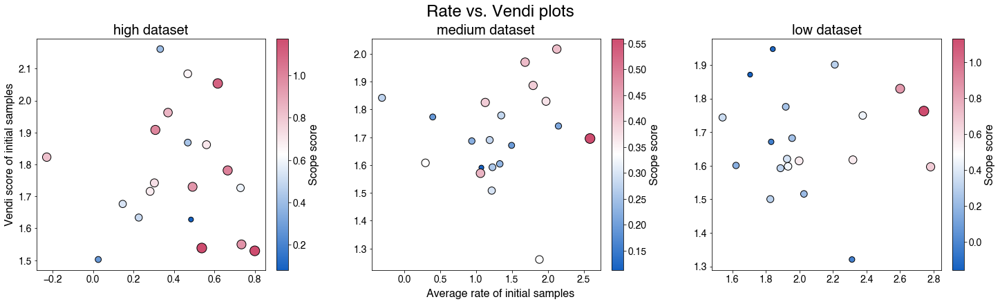

In [14]:
# Plot average rate vs. Vendi score
fig,axes = plt.subplots(1,3,figsize=(20,6),gridspec_kw={"wspace": 0.1},constrained_layout=True)
fig.suptitle("Rate vs. Vendi plots")
fig.supxlabel("Average rate of initial samples",fontsize=16)
for i,dset in enumerate(datasets):
    ax = axes[i]
    x = initial_obj[dset]
    y = initial_vendi[dset]
    raw_size_data = np.array(score_dict[dset])
    labels = list(range(nr_seeds))

    size_min, size_max = 50, 200
    data_min, data_max= raw_size_data.min(), raw_size_data.max()
    sizes = size_min + (raw_size_data - data_min) * (size_max - size_min) / (data_max - data_min)

    plot = ax.scatter(x=x, y=y, s=sizes, c = raw_size_data, cmap="Doyle_cont", edgecolors="k", alpha=1)
    axes[0].set_ylabel('Vendi score of initial samples')
    ax.set_title(f'{dset} dataset')
    cbar = fig.colorbar(plot, ax=ax)
    cbar.set_label('Scope score') 
plt.show()

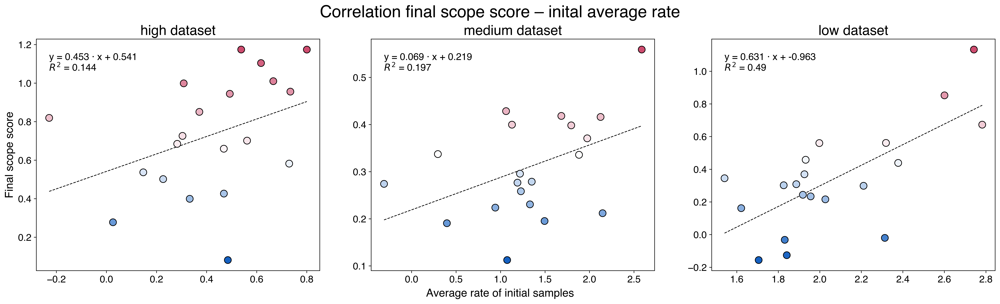

In [15]:
fig,axes = plt.subplots(1,3,figsize=(20,6),gridspec_kw={"wspace": 0.1},constrained_layout=True,dpi=600)
fig.suptitle("Correlation final scope score – inital average rate")
fig.supxlabel("Average rate of initial samples",fontsize=16)
for i,dset in enumerate(datasets):
    ax = axes[i]
    x = np.array(initial_obj[dset]).reshape(-1, 1)  # Reshape for sklearn
    y = np.array(score_dict[dset])
    model = LinearRegression().fit(x, y)
    y_pred = model.predict(x)
    sorted_idx = x[:, 0].argsort()
    x_sorted = x[sorted_idx]
    y_pred_sorted = y_pred[sorted_idx]
    r2 = r2_score(y, y_pred)
    ax.plot(x_sorted, y_pred_sorted, color='black', linewidth=1,linestyle="--",zorder=1)
    ax.scatter(x, y, c = y, cmap="Doyle_cont", edgecolors="k", alpha=1,s=100,zorder=2)
    axes[0].set_ylabel('Final scope score')
    ax.set_title(f'{dset} dataset')
    ax.text(x=x.min(),y=y.max()-0.1 * (y.max()-y.min()),s=f"y = {model.coef_[0]:.3f} · x + "\
            f"{model.intercept_:.3f}\n$R^2$ = {round(r2,3)}", fontsize=14)
plt.show()

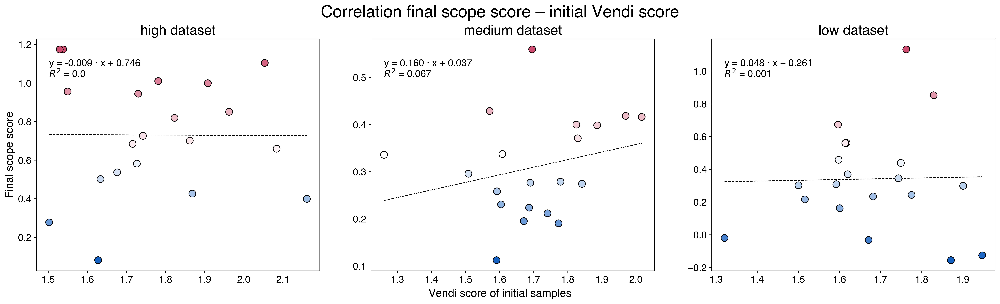

In [16]:
fig,axes = plt.subplots(1,3,figsize=(20,6),gridspec_kw={"wspace": 0.1},constrained_layout=True,dpi=600)
fig.suptitle("Correlation final scope score – initial Vendi score")
fig.supxlabel("Vendi score of initial samples",fontsize=16)
for i,dset in enumerate(datasets):
    ax = axes[i]
    x = np.array(initial_vendi[dset]).reshape(-1, 1)  # Reshape for sklearn
    y = np.array(score_dict[dset])
    model = LinearRegression().fit(x, y)
    y_pred = model.predict(x)
    sorted_idx = x[:, 0].argsort()
    x_sorted = x[sorted_idx]
    y_pred_sorted = y_pred[sorted_idx]
    r2 = r2_score(y, y_pred)
    ax.scatter(x, y, c = y, cmap="Doyle_cont", edgecolors="k", alpha=1, s=100,zorder=2)
    ax.plot(x_sorted, y_pred_sorted, color='black', linewidth=1,linestyle="--",zorder=1)
    axes[0].set_ylabel('Final scope score')
    ax.set_title(f'{dset} dataset')
    ax.text(x=x.min(),y=y.max()-0.13*(y.max()-y.min()),s=f"y = {model.coef_[0]:.3f} · x "\
            f"+ {model.intercept_:.3f}\n$R^2$ = {round(r2,3)}", fontsize=14)
plt.show()

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


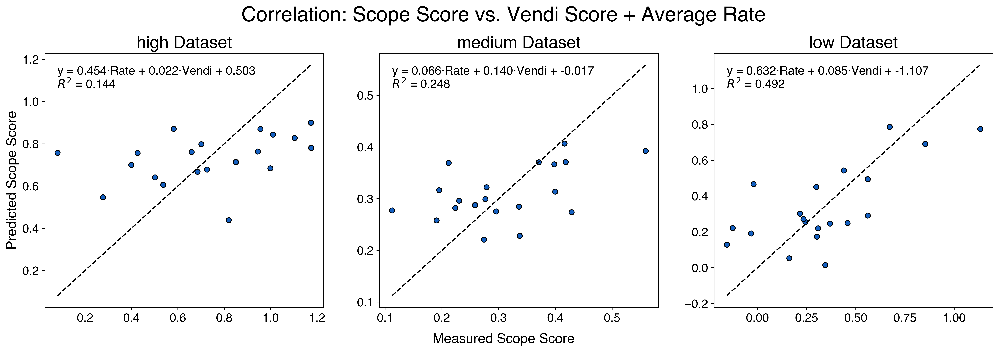

In [17]:
fig, axes = plt.subplots(1, 3, figsize=(20, 5.5), gridspec_kw={"wspace": 0.2},dpi=600)
fig.suptitle("Correlation: Scope Score vs. Vendi Score + Average Rate", y=1.02,fontsize=24)
fig.supxlabel("Measured Scope Score", fontsize=16)

for i, dset in enumerate(datasets):
    ax = axes[i]
    x1 = np.array(initial_obj[dset]).reshape(-1, 1)
    x2 = np.array(initial_vendi[dset]).reshape(-1, 1)
    y = np.array(score_dict[dset])
    X = np.column_stack((x1, x2))

    # Fit linear model
    model = LinearRegression().fit(X, y)
    y_pred = model.predict(X)
    r2 = r2_score(y, y_pred)

    # Plot actual vs predicted
    ax.scatter(y, y_pred, edgecolors='k', color=all_colors[1])
    ax.plot([y.min(), y.max()], [y.min(), y.max()], '--', color="black")

    if i == 0:
        ax.set_ylabel('Predicted Scope Score',fontsize=16)
    ax.set_title(f'{dset} Dataset',fontsize=20)

    # Add regression equation text
    text_x = y.min()
    text_y = y.max() - 0.1 * (y.max() - y.min())
    equation = (
        f"y = {model.coef_[0]:.3f}·Rate + {model.coef_[1]:.3f}·Vendi + {model.intercept_:.3f}\n"
        f"$R^2$ = {r2:.3f}"
    )
    ax.text(text_x, text_y, equation, fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


The correlation analyis indicates there is no correlation between the final scope scores and the Vendi scores (meaning diversity) of the initial samples, but a moderate positive correlation with the average performance of the initial samples. 

In [18]:
# check the reverse: How are the final scope scores when the initiations with the highest initial average rates are regarded?
sum_top_rates = pd.DataFrame(np.nan,index=datasets,columns=["Mean final scope score",
                                                            "Worst final scope score",
                                                            "Mean final scope score top5 initial av. rates",
                                                            "Worst final scope score top5 initial av. rates",
                                                            "Mean initial average rate",
                                                            "Mean top5 initial rates"])
best_init_final_scope = {}
best_init_rate = {}
for dset in datasets:
    sum_top_rates.loc[dset,"Mean initial average rate"] = sum_initial_samples.loc[dset,"Mean initial average rate"]
    sum_top_rates.loc[dset,"Mean final scope score"] = round(np.mean(np.array(score_dict[dset])),3)
    sum_top_rates.loc[dset,"Worst final scope score"] = round(np.min(np.array(score_dict[dset])),3)


    # get the seeds that have the top 5 initial average rates
    indexed_rates = list(enumerate(initial_obj[dset]))  # generate (index,av. rate) tuples
    top_5 = sorted(indexed_rates, key=lambda x: x[1], reverse=True)[:5]  # sort by score
    best_seeds = [index for index, rate in top_5]
    print(f"Top 5 seeds by initial average rate ({dset} dataset):", best_seeds)

    # get the averages of the final samples for the top 5 seeds
    best_init_final_scope[dset] = [dfs_raw_data[dset][i].loc[8,"scope"] for i in best_seeds]
    best_init_rate[dset] = [initial_obj[dset][i] for i in best_seeds]

    sum_top_rates.loc[dset,"Mean final scope score top5 initial av. rates"] = round(np.mean(best_init_final_scope[dset]),3)
    sum_top_rates.loc[dset,"Worst final scope score top5 initial av. rates"] = round(np.min(best_init_final_scope[dset]),3)
    sum_top_rates.loc[dset,"Mean top5 initial rates"] = round(np.mean(best_init_rate[dset]),3)

sum_top_rates

Top 5 seeds by initial average rate (high dataset): [9, 8, 2, 0, 14]
Top 5 seeds by initial average rate (medium dataset): [2, 14, 8, 11, 6]
Top 5 seeds by initial average rate (low dataset): [3, 5, 19, 0, 1]


,Mean final scope score,Worst final scope score,Mean final scope score top5 initial av. rates,Worst final scope score top5 initial av. rates,Mean initial average rate,Mean top5 initial rates
high,0.730,0.081,0.965,0.582,0.417,0.710
medium,0.311,0.112,0.379,0.212,1.330,2.143
low,0.341,-0.156,0.732,0.439,2.068,2.564


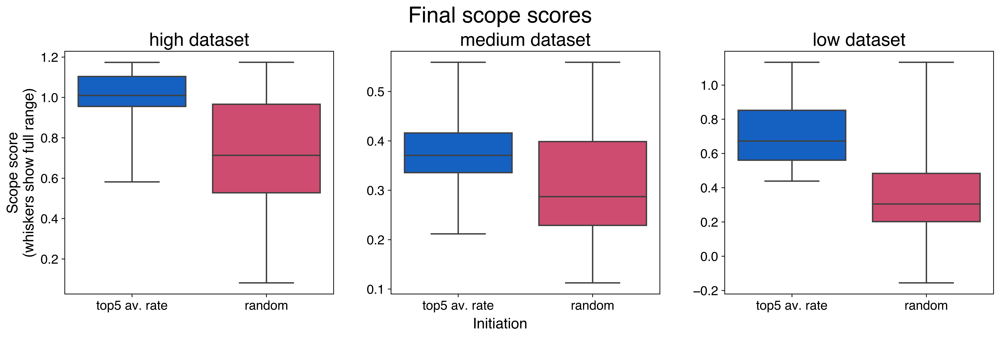

Note that the whiskers show the full data range.


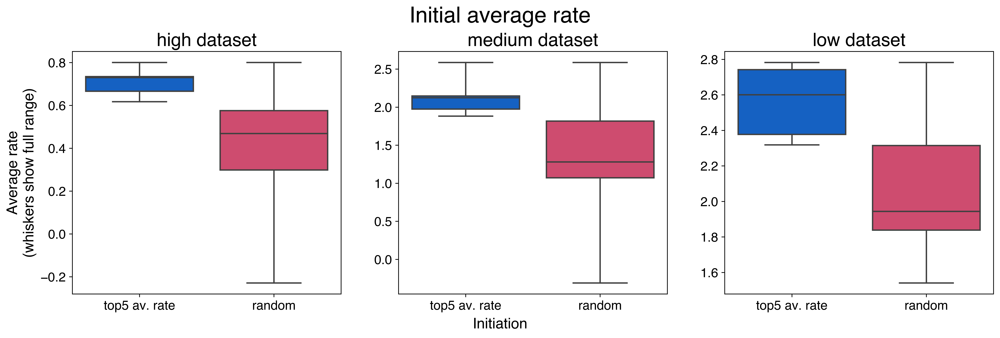

Note that the whiskers show the full data range.


In [19]:
for results_type in ["scope","rate"]:
    fig,axes = plt.subplots(1,3,figsize=(15,5),gridspec_kw={"wspace": 0.1},constrained_layout=True,dpi=600)
    if results_type == "scope":
        fig.suptitle("Final scope scores")
    else:
        fig.suptitle("Initial average rate")
    fig.supxlabel("Initiation",fontsize=16)
    for i,dset in enumerate(datasets):
        if results_type == "scope":
            df = pd.DataFrame([best_init_final_scope[dset],score_dict[dset]])
        else:
            df = pd.DataFrame([best_init_rate[dset],initial_obj[dset]])
        df_long = df.T.melt(var_name='Row', value_name='Value')
        df_long.loc[df_long["Row"] == 0,"Row"] = "top5 av. rate"
        df_long.loc[df_long["Row"] == 1,"Row"] = "random"
        ax = axes[i]
        palette = [all_colors[1], all_colors[0]]
        sns.boxplot(ax=ax,x='Row', y='Value', data=df_long, whis=[0,100], palette=palette, saturation=1)
        if i == 0 and results_type == "scope":
            ax.set_ylabel('Scope score\n(whiskers show full range)')
        elif i == 0 and results_type == "rate":
            ax.set_ylabel("Average rate\n(whiskers show full range)")
        else:
            ax.set_ylabel("")
        ax.set_xlabel("")
        ax.set_title(f'{dset} dataset')
    plt.show()
    print("Note that the whiskers show the full data range.")

The initations with the highest average rates results in scopes that have higheer average rates than the average of all initiations. We therefore recommend to initialize the scope with three samples that are expected to perform well (e. g.: model substrate + two additional substrates).